## Исследование текста (описание и название вакансии)

В рамках tokenize_vacancy_description.ipynb мы предобработали описание: унифицировали слова и выкинули лишние

Теперь посмотрим что пишут компании про различные роли

In [63]:
import pandas as pd

In [64]:
df = pd.read_csv('./vacancies_merged_prizn_tokenize.csv')

In [65]:
df

,Unnamed: 0,profession,profession_full,vacancy_description,date_published,payment_from,payment_to,experience,employment,city,...,vacancy_count,staff_count,catalogues,source,dms,ai,work_format,education,1с,vacancy_description_tokenize
0,0,Начальник отдела,Руководитель отдела сопровождения внутренней и...,"Компания ""Санкт-Петербургская биржа"" Вам предс...",2026-03-25,NaN,NaN,NaN,Полная занятость,Москва,...,NaN,NaN,NaN,scrapping,1,0,0,0,0,компания биржа осуществление руководство напра...
1,1,Java,Java (Senior)( ТЕХНОЛОГИИ ОТРАСЛЕВОЙ ТРАНСФОРМ...,"Компания ""ТЕХНОЛОГИИ ОТРАСЛЕВОЙ ТРАНСФОРМАЦИИ""...",2026-03-27,NaN,NaN,Более 6 лет,Полная занятость,Москва,...,NaN,NaN,NaN,scrapping,1,0,0,0,0,компания технологии отраслевой трансформация с...
2,2,Специалист,Middle+ AQA специалист,"Компания ""Компания Ритейл Сервис"" Мы - аккреди...",2026-03-26,140000.0,180000.0,NaN,Полная занятость,Барнаул,...,NaN,NaN,NaN,scrapping,0,0,2,0,0,компания компания - ит - компания по artix- ре...
3,3,Технолог,Технолог( АКРИХИН ),"Компания ""АКРИХИН"" Обязанности: Обеспечивать ...",2026-03-25,NaN,NaN,NaN,Полная занятость,Старая Купавна,...,NaN,NaN,NaN,scrapping,1,0,0,2,0,компания акрихин обязанность соблюдение персон...
4,4,Project manager,Project Manager Game Dev( Beresnev Games ),"Компания ""Beresnev Games"" Мы в поиске Project ...",2026-03-26,NaN,NaN,NaN,Полная занятость,Москва,...,NaN,NaN,NaN,scrapping,0,0,2,0,0,компания поиск команда внесете вклад достижени...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30859,30862,Практикант / стажёр Документовед,Практикант / стажёр Документовед,ГНЦ РФ АО «ВНИИНМ» разрабатывает конструкционн...,2026-04-08,0.0,0.0,NaN,NaN,"{'id': 4, 'title': 'Москва', 'declension': 'в ...",...,3.0,менее 50,"[{'id': 1, 'title': 'Административная работа, ...",api,1,0,0,0,0,гнц ао вниинм материал топливо вид реактор исс...
30860,30863,Технический специалист/ Системный администратор,Технический специалист/ Системный администратор,"Обязанности:\n• Установка, обновление и админи...",2026-04-08,80000.0,100000.0,NaN,NaN,"{'id': 4, 'title': 'Москва', 'declension': 'в ...",...,1.0,менее 50,"[{'id': 33, 'title': 'IT, Интернет, связь, тел...",api,0,0,0,0,0,обязанность установка обновление администриров...
30861,30864,Стажер в IT отдел,Стажер в IT отдел,Здесь занимаются поддержкой IT-платформ и их р...,2026-04-08,0.0,0.0,NaN,NaN,"{'id': 4, 'title': 'Москва', 'declension': 'в ...",...,0.0,более 5000,"[{'id': 33, 'title': 'IT, Интернет, связь, тел...",api,1,0,1,0,0,здесь поддержка it - платформа развитие также ...
30862,30865,Сотрудник технической поддержки,Сотрудник технической поддержки,"Добрый день!\nМы компания Lasertech, занимаемс...",2026-04-07,80000.0,0.0,NaN,NaN,"{'id': 4, 'title': 'Москва', 'declension': 'в ...",...,1.0,менее 50,"[{'id': 33, 'title': 'IT, Интернет, связь, тел...",api,0,0,0,1,1,день компания lasertech производство продажа о...


#### Унифицируем названия вакансий

Проблема: датасет собирался с двух источников, нет единой категории, по которой можно было бы группировать все данные.

Сделаем ее

Посмотрим на самые популярные слова в названии профессий. По ним можно будет сделать разметку

In [66]:
df["profession_raw"] = df.profession + " " + df.profession_full

In [67]:
df.profession_raw.iloc[1]

'Java Java (Senior)( ТЕХНОЛОГИИ ОТРАСЛЕВОЙ ТРАНСФОРМАЦИИ )'

In [68]:
import re


def get_words_from_column_uniq_by_row(series):
    words = []
    for row in series:
        # удаляем из каждого слова все символы, кроме рус/англ букв и цифр и не берем короткие слова
        uniq_words = set([i.strip(" .") for i in re.split(r"[()\s—.]+", row.lower()) if len(re.sub(r"[^a-zA-Zа-яА-ЯёЁ0-9]+", " ", i)) > 1])
        words.extend(uniq_words)

    return words

words_vacancy_name = get_words_from_column_uniq_by_row(df.profession_raw)


len(words_vacancy_name)

141574

In [69]:
from collections import Counter

# из списка слов делает словарь ключ-частотность
Counter(words_vacancy_name)

Counter({'инженер': 6028,
         'по': 5973,
         'технолог': 2603,
         'специалист': 2428,
         'менеджер': 2332,
         'разработчик': 2226,
         'ведущий': 2220,
         'руководитель': 1950,
         'системный': 1723,
         'программист': 1721,
         'администратор': 1569,
         'проектов': 1342,
         'инженер-технолог': 1308,
         'аналитик': 1207,
         '1с': 1127,
         'отдела': 1124,
         'it': 1089,
         'технологии': 967,
         'главный': 921,
         'безопасности': 863,
         'информационные': 858,
         'интернет': 847,
         'начальник': 802,
         'senior': 784,
         'developer': 725,
         'старший': 710,
         'engineer': 707,
         'сервисный': 684,
         'оборудования': 640,
         'архитектор': 608,
         'кипиа': 605,
         'ремонту': 596,
         'на': 582,
         'информационной': 555,
         'производства': 550,
         'обслуживанию': 510,
         'manager': 47

Видим, что по своей сути самые популярные слова = профессии, что и логично
Сделаем на основании полученного разбиения словарь характерных слов для каждой профессии и присвоим их

Разметка составлена экспертно + обогащен llm для полноценности, склонения

In [70]:
CATEGORY_KEYWORDS = {
    "1с": [
        "1с", "1c", "1с-разработчик", "1с программист",
        "1с разработчик", "1с аналитик", "1с консультант",
        "1с erp", "1с ут", "1с бухгалтерия"
    ],

    "devops": [
        "devops", "sre", "platform engineer",
        "kubernetes", "docker", "ci cd", "ci/cd",
        "terraform", "ansible", "helm"
    ],

    "qa": [
        "qa", "test", "testing", "тестировщик",
        "тестированию", "quality assurance",
        "manual qa", "automation qa",
        "qa engineer", "инженер тестирования"
    ],

    "аналитик": [
        "аналитик", "analysis", "data analyst",
        "business analyst", "system analyst",
        "системный аналитик", "бизнес аналитик",
        "product analyst", "data scientist",
        "bi", "bi аналитик", "etl"
    ],

    "архитектор": [
        "архитектор", "architect", "solution architect",
        "software architect", "system architect",
        "enterprise architect"
    ],

    "администратор": [
        "администратор", "sysadmin",
        "system administrator",
        "системный администратор",
        "linux администратор",
        "windows администратор"
    ],

    "безопасность": [
        "security", "безопасности",
        "информационной безопасности",
        "кибербезопасность", "иб",
        "soc", "pentest", "pentester",
        "security engineer"
    ],

    "поддержка": [
        "support", "поддержки",
        "технической поддержки",
        "helpdesk", "service desk",
        "customer support", "писатель"
    ],

    "smm": [
        "smm", "smm-менеджер",
        "контент", "контент-менеджер",
        "таргетолог", "маркетолог",
        "digital", "seo", "ppc"
    ],

    "продажи": [
        "sales", "продаж", "продажам",
        "аккаунт", "account manager",
        "продавец", "бизнес развитие",
        "business development", "bdm"
    ],

    "product manager": [
        "product manager", "product owner",
        "product", "продакт",
        "продакт менеджер",
        "product lead"
    ],

    "project manager": [
        "project manager", "project",
        "pm", "руководитель проектов",
        "менеджер проектов",
        "delivery manager",
        "scrum master"
    ],

    "программист": [
        "разработчик", "developer", "программист",
        "software engineer", "software developer",
        "backend", "backend разработчик",
        "frontend", "frontend разработчик",
        "fullstack", "full stack",
        "web developer",
        "java", "python", "php", "golang",
        "go developer", "node", "nodejs",
        "javascript", "typescript",
        "c#", "c++", "dotnet", ".net",
        "react", "angular", "vue",
        "ios", "android", "mobile",
        "unity", "unreal"
    ],

    "data engineer": [
        "data engineer", "big data",
        "spark", "hadoop", "etl",
        "dwh", "data platform"
    ],

    "инженер": [
        "инженер", "engineer",
        "инженер-технолог",
        "инженер механик",
        "инженер кипиа",
        "кипиа", "технолог",
        "технический специалист",
        "service engineer",
        "field engineer",
        "сетевой инженер", "инженера"
        "network engineer"
    ],

    "менеджер": [
        "менеджер", "manager",
        "руководитель", "lead",
        "team lead", "директор",
        "начальник", "head",
        "руководитель отдела"
    ],

    "оператор": [
        "оператор", "машинист",
        "водитель", "оператор линии",
        "оператор станка"
    ],

    "техник": [
        "техник", "слесарь",
        "наладчик", "электромонтер",
        "механик", "монтажник"
    ],

    "специалист": ["специалист", "мастер"]
}

Так же учтем, что должен учитываться приоритет. Более точечные вакансии должны определяться первее, чем более общие
Например 1с-разработчик должен определиться как 1с, а не программист, так как это более специфичная роль

Поэтому введем ранжирование

In [71]:
CATEGORY_PRIORITY = [
    "1с",
    "devops",
    "qa",
    "data engineer",
    "аналитик",
    "архитектор",
    "администратор",
    "безопасность",
    "поддержка",
    "smm",
    "продажи",
    "product manager",
    "project manager",
    "программист",
    "инженер",
    "менеджер",
    "оператор",
    "техник",
    "специалист"
]

In [72]:
def match_category(profession):
    text = profession.lower()

    for category in CATEGORY_PRIORITY:
        for keyword in CATEGORY_KEYWORDS[category]:
            if keyword in text:
                return category

    return "другое"

df['vacancy_category'] = df['profession_raw'].apply(match_category)

In [73]:
df['vacancy_category'].value_counts()

vacancy_category
инженер            7823
программист        3151
менеджер           2591
другое             2451
администратор      1574
аналитик           1555
специалист         1369
1с                 1320
техник             1272
безопасность       1176
project manager    1028
smm                1019
qa                  911
продажи             828
оператор            692
архитектор          685
product manager     493
devops              385
поддержка           373
data engineer       168
Name: count, dtype: int64

In [74]:
df.profession_raw[df.vacancy_category == "другое"].head(50)

65      Конструктор Ведущий конструктор отдела автомат...
126                          Контролер Контролер лаборант
246     Консультант Сервисный консультант в дилерский ...
248                              Дизайнер Дизайнер миссий
328                           Металлург Главный металлург
351     Горнорабочий Горнорабочий подземный на маркшей...
359                                       Эксперт Эксперт
392                  Механизатор Механизатор - Тракторист
431     Консультант Консультант отдела защиты информац...
484                  Механизатор Механизатор - Тракторист
571                   Сборщик пк Сборщик ПК / Сборщик РЭА
624             Координатор проектов Координатор проектов
629                          Химик Химик( Гальвано плюс )
654            Сервисный центр Электрик в сервисный центр
695                                     Колорист Колорист
706     Испытатель Пилот-испытатель FPV( Алабуга, ОЭЗ ...
710     Эксперт Эксперт по направлению деятельности "4...
774     Ландша

Видим, что остались слишком узкие категории. Странно, что некоторые из них в принципе были отнесены к категории айти, например химик, кинолог и так далее

В общем, не будем пытаться из них что-то вычленить. Они останутся в категории "Другое", это менее 10% данных из 30к

In [75]:
df.to_csv('vacancies_merged_prizn_tokenize_category.csv')

## Описание вакансий

In [76]:
words = get_words_from_column_uniq_by_row(df.vacancy_description_tokenize)

len(words)

2782736

Сделали список слов, где объединили слова из всех вакансий. Если слово несколько раз упоминается в вакансии, то в список от нее оно попадет в одном экзепляре (чтобы кол-во упоминаний слов = кол-во вакансий с ними)

In [77]:
def get_freq_df_by_words(_words):
    freq = Counter(_words)

    df_freq = pd.DataFrame(freq.items(), columns=["word", "count"])
    df_freq = df_freq.sort_values(by="count", ascending=False)

    return df_freq

df_freq = get_freq_df_by_words(words)

In [78]:
df_freq

,word,count
28,работа,30123
47,компания,28899
4,опыт,25465
59,год,18647
239,знание,17935
...,...,...
35862,ocнoвными,1
35861,cвoевpемeнныe,1
35860,амак,1
35858,"копирования,-",1


Готов датасет поплуряности слов, где count — кол-во вакансий, в которых встречается слово

In [79]:
!pip install matplotlib


[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


In [80]:
import matplotlib.pyplot as plt

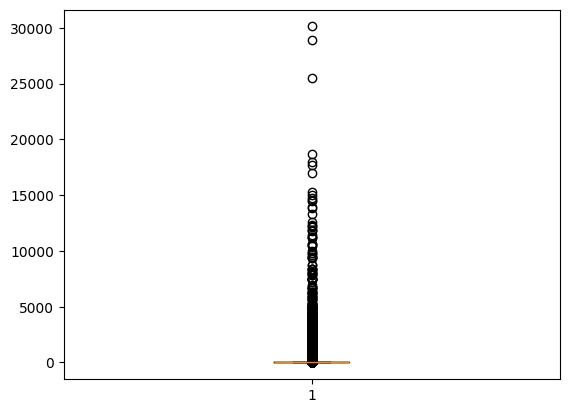

In [81]:
plt.boxplot(df_freq['count'])
plt.show()

In [82]:
df_freq['count'].mean()

np.float64(45.822193680119874)

In [83]:
df_freq['count'].median()

np.float64(2.0)

Видно, что бОльшая часть слов встречается достаточно редко.

Нам хочется посмотреть на общией тенденции, поэтому оставим слова, которые встречаются чаще 100 раз из 30к вакансий (число выбрано экспертно). Таким образом отсечем слишком редкие слова.

In [84]:
df_freq = df_freq[df_freq['count'] > 100]

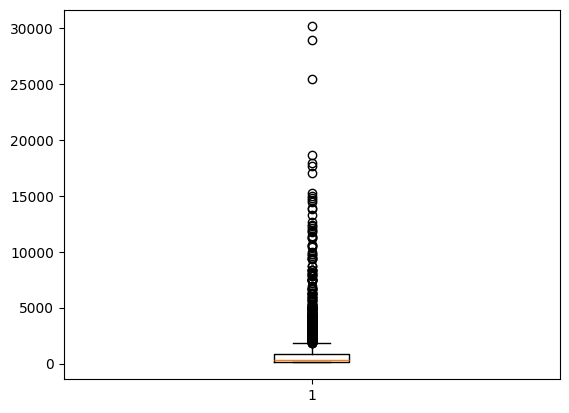

In [85]:
plt.boxplot(df_freq['count'])
plt.show()

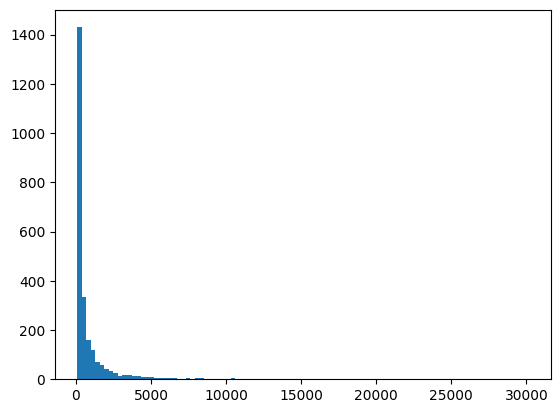

In [86]:
plt.hist(df_freq['count'], bins=100)
plt.show()

Видим что-то наподобие экпоненциального распределения.
То, о чем говорили и оно логично: 
- много слов имееют мало упоминаний
- мало слов имеют много упоминаний

Чем меньше у слова упоминаний, тем более специфическую характеристику вакансии/сферы оно может отображать

### Самые популярные

In [87]:
df_freq.head(60)

,word,count
28,работа,30123
47,компания,28899
4,опыт,25465
59,год,18647
239,знание,17935
49,требование,17683
169,команда,17001
319,обязанность,15283
317,образование,14986
77,разработка,14760


Самые популярные слова отражают общие тенденци на рынке, "базовые преимущества", которые не являются чем-то выдающимся:
- устройство по тк (13к упоминаний)
- обещают рост, развитие, обучение (10к+ упоминаний)
- дмс (10к упоминаний)
- есть офис (9к упоминаний)
- выдать оборудование (10к)
- компенсации различные (7к)

То устройство по тк не упомянуто во всех 30к вакансий не означает, что другие компании нанимают нелегально. Однако частое упоминание этих слов позволяет понять, что это популярные преимущества


Образование упоминается примерно в каждой второй вакансии

### Средняя популярность

Посмотрим на слова, которые встречаются в 5-10% вакансиях (в каждой десятой - двадцатой)

In [88]:
lower_bound = len(df) * 0.05
upper_bound = len(df) * 0.10

df_freq_mid = df_freq[(df_freq["count"] >= lower_bound) & (df_freq["count"] <= upper_bound)]

In [89]:
df_freq_mid.head(60)

,word,count
238,запрос,3084
3,деятельность,3038
1286,договор,3020
308,цикл,3011
211,город,2972
264,составление,2937
63,подразделение,2901
513,спорт,2895
17,sql,2877
368,состояние,2871


Какой-то мощный вывод сделать тяжело, так как среднечастостные слова на то и средние. Они часто проблескивают в профессиях, но тренд не отражают + видим смешение разных профессий

Попробуем сфокусироваться на навыках

### Навыки

Навыки в IT = в основном технологии или языки программирования. Зачастую их указывают на английском, поэтому отфильтруем все слова из русских букв

In [90]:
def delete_rus_words_from_freq(df_freq):
    return df_freq[
        # берем слова из английских букв/цифр и 1с
        df_freq["word"].str.match(r"^[a-zA-Z0-9сС.+#/-]+$")
        # ручной блеклист популярных англоязычных слов не являющимися навыками
        & ~df_freq["word"].isin(["ozon", "wildberries", "lamoda", "http", "yandex"])
    ]

df_freq_no_rus = delete_rus_words_from_freq(df_freq)
df_freq_no_rus.head(60)

,word,count
76,it,4610
559,1с,3438
17,sql,2877
293,linux,2790
289,python,2652
581,excel,2057
186,api,1869
679,git,1830
629,windows,1774
303,postgresql,1733


Для визуального отображения частотности воспользуемся облаком слов, построим с помощью поплуярной библиотеки wordcloud https://github.com/amueller/word_cloud

In [91]:
!pip install wordcloud


[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


Референсы для wordcloud

Базовый пример из библиотеки https://github.com/amueller/word_cloud/blob/main/examples/simple.py

Класс WordCloud https://github.com/amueller/word_cloud/blob/93c5e4cd50c5f2c56ec7eb624a620790dab5df6c/wordcloud/wordcloud.py#L155

Функция для генерации по словарю generate_from_frequencies https://github.com/amueller/word_cloud/blob/93c5e4cd50c5f2c56ec7eb624a620790dab5df6c/wordcloud/wordcloud.py#L392

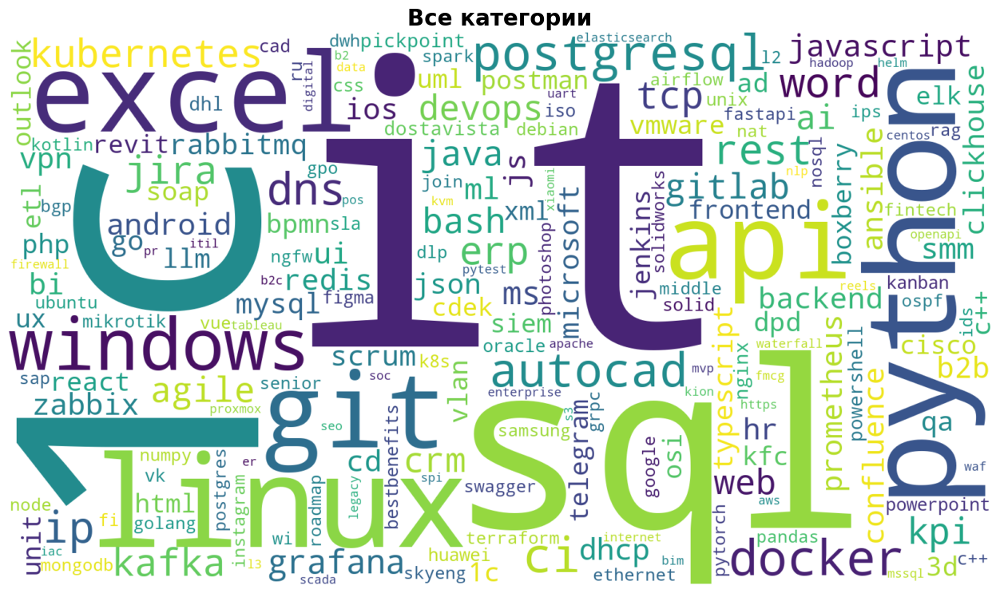

In [92]:
from wordcloud import WordCloud


def word_cloud_from_freq_df(_df_freq, title):
    # создаем словарь слово-частота, чтобы подать на вход облаку
    word_cloud_dict = dict(zip(_df_freq.word, _df_freq["count"]))

    wc = WordCloud(
        width=1600,
        height=900,
        background_color="white"
    ).generate_from_frequencies(word_cloud_dict)

    # библиотека создала фото, теперь надо его отрисовать
    plt.figure(figsize=(16, 9))
    # чтобы отображать заголовок (для какой категории)
    plt.title(title, fontdict={"fontsize": 20, "fontweight": "bold"})
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

word_cloud_from_freq_df(df_freq_no_rus, title="Все категории")

Видим смешение из разных сфер, видны главные "столпы" айти: языки программировиания, операционные системы, 1с, офисный пакет. Самые популярные = универсальные скиллы в целом: python, sql, excel (1с не универсален, в отдельной сфере существует закрытой)

Попробуем сделать облако слов по категориям профессий

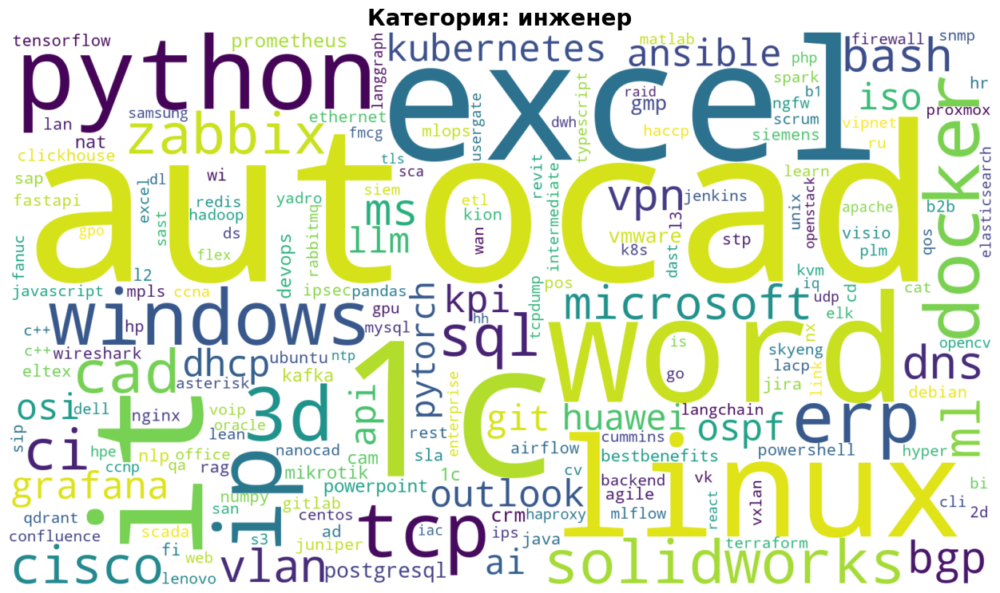

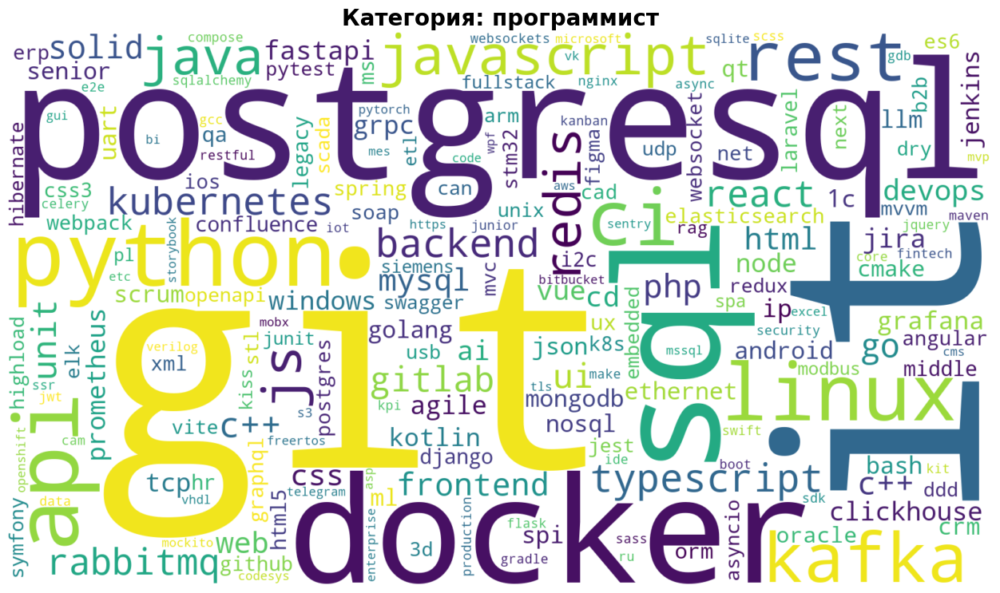

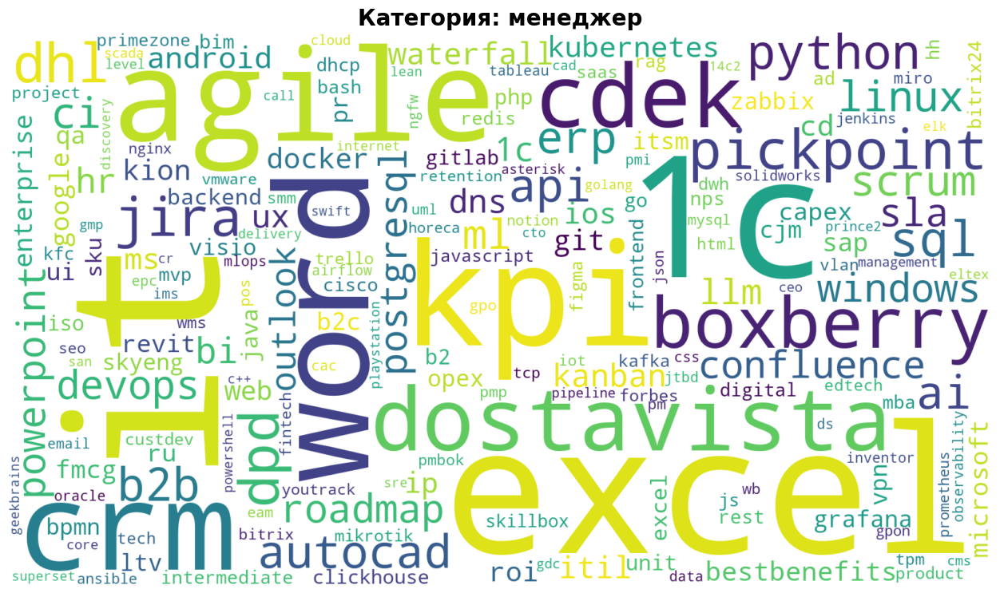

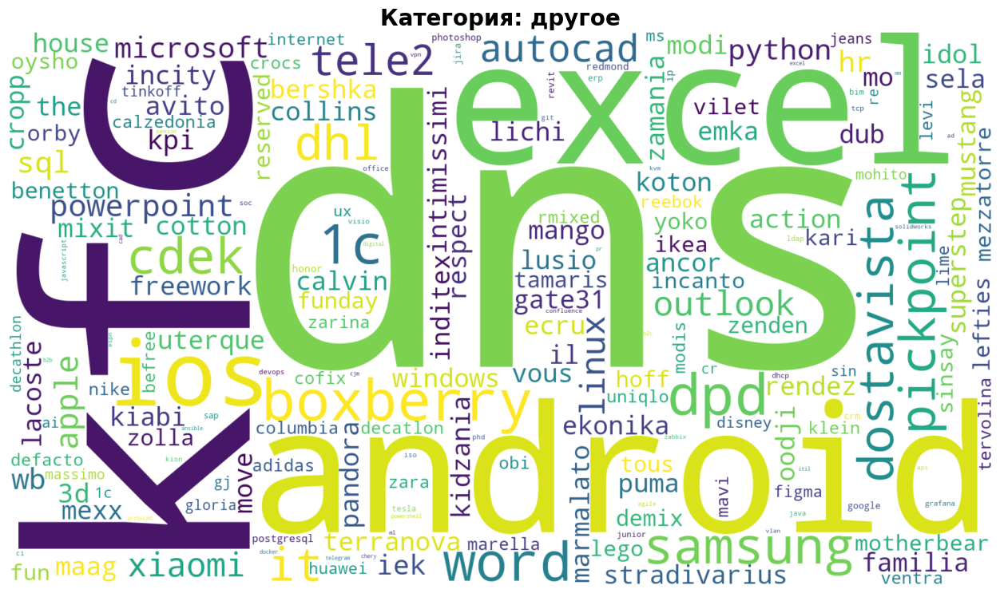

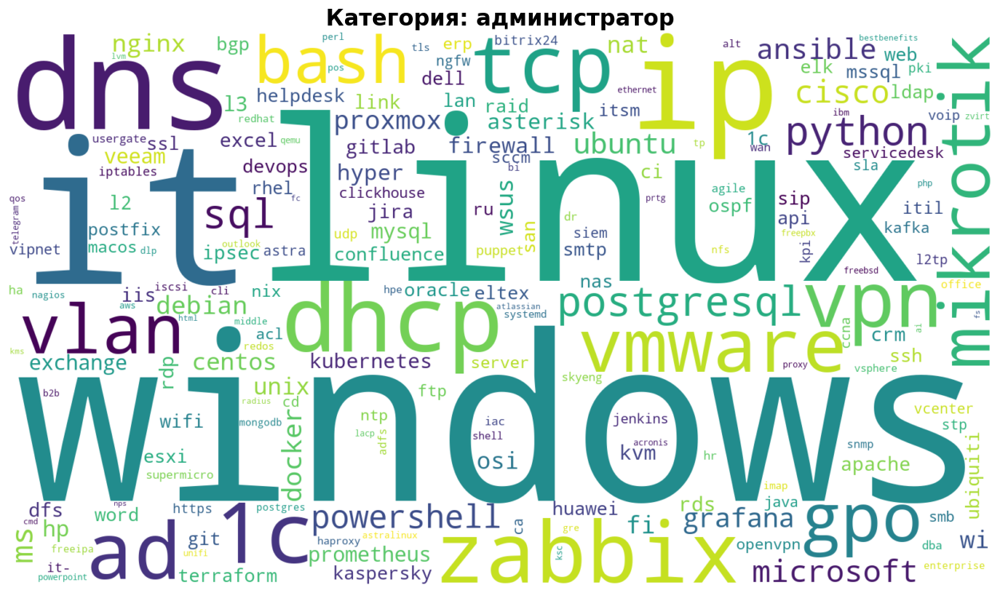

...

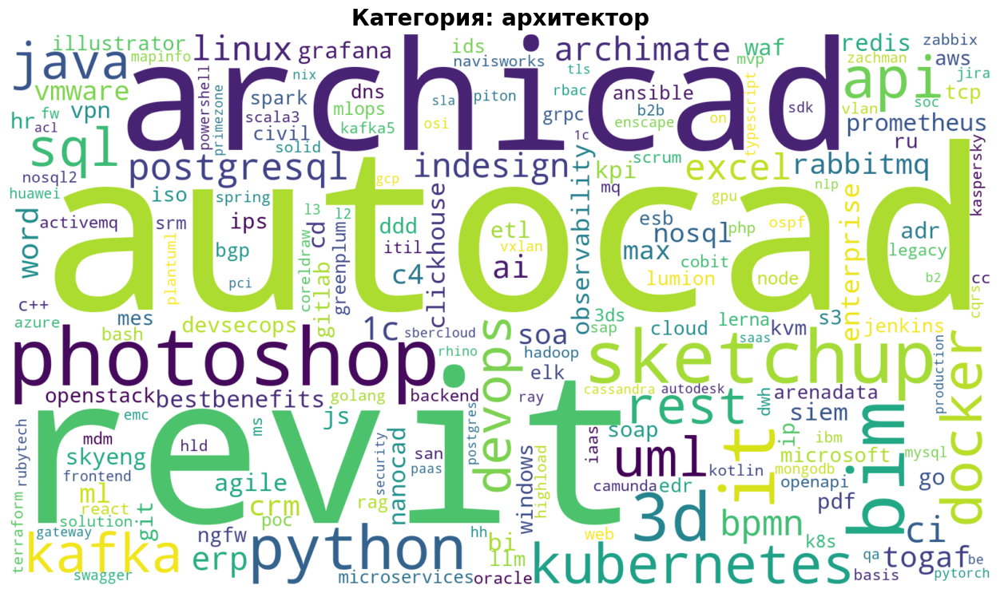

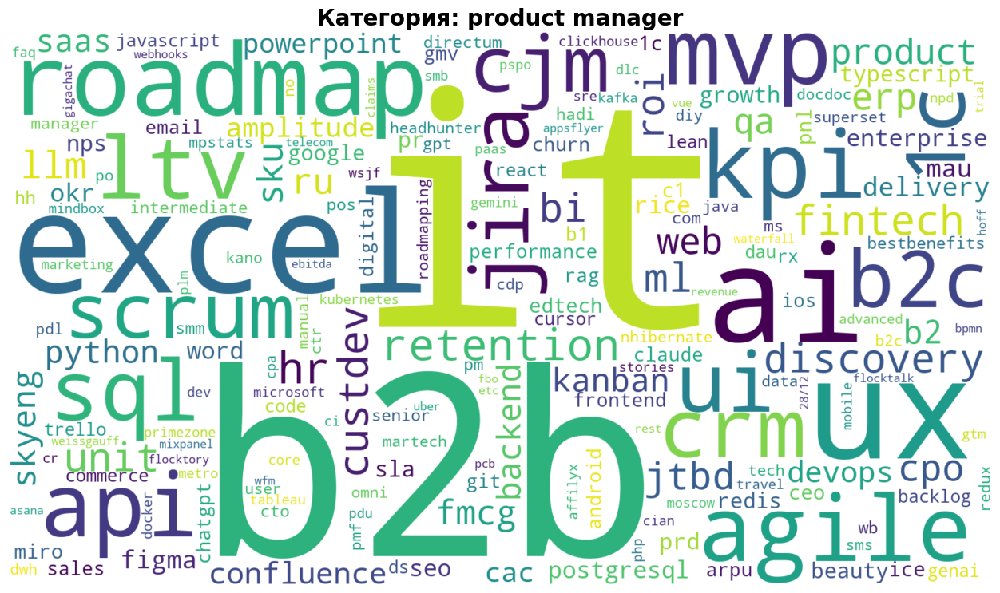

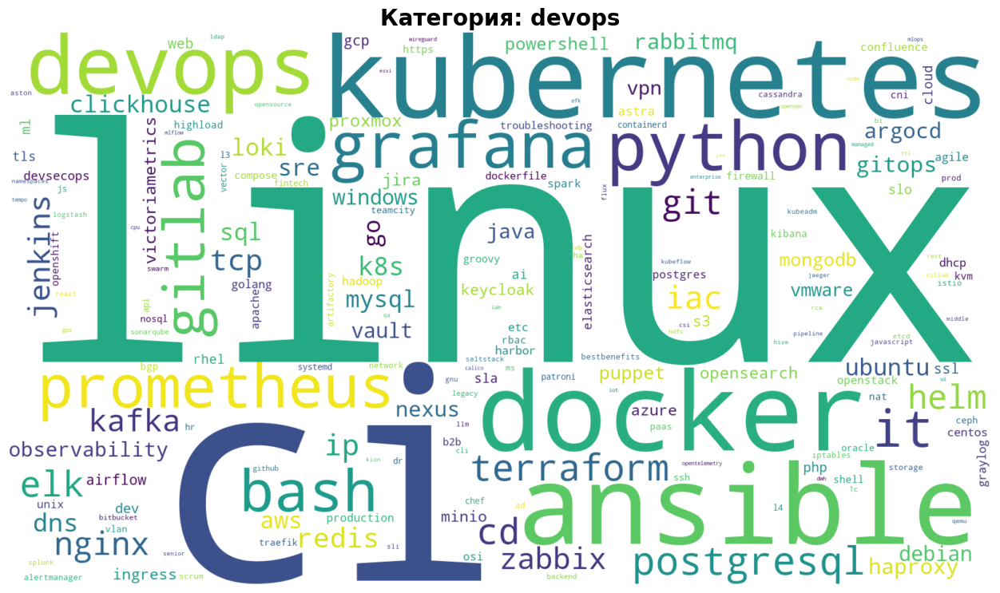

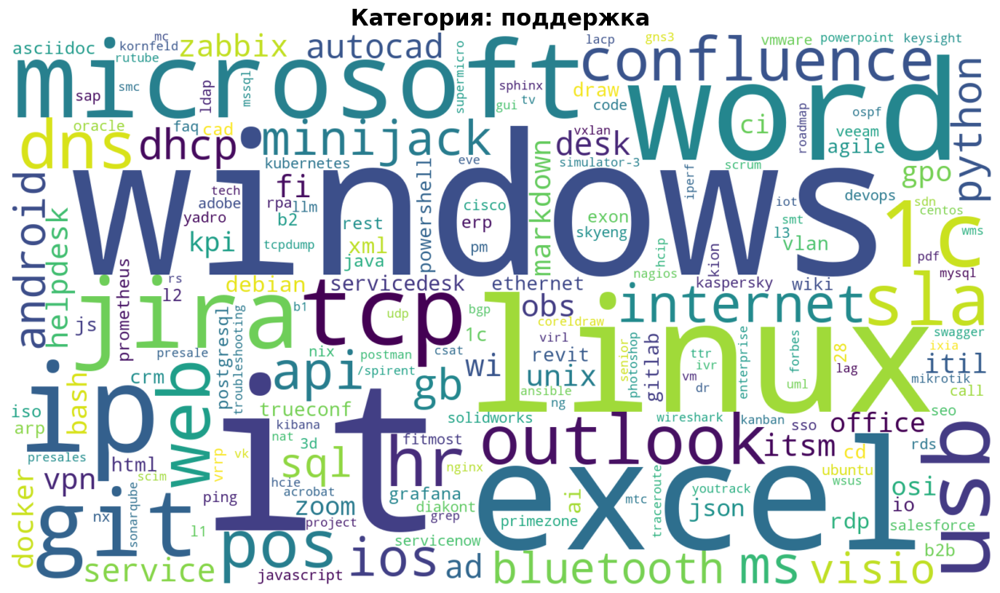

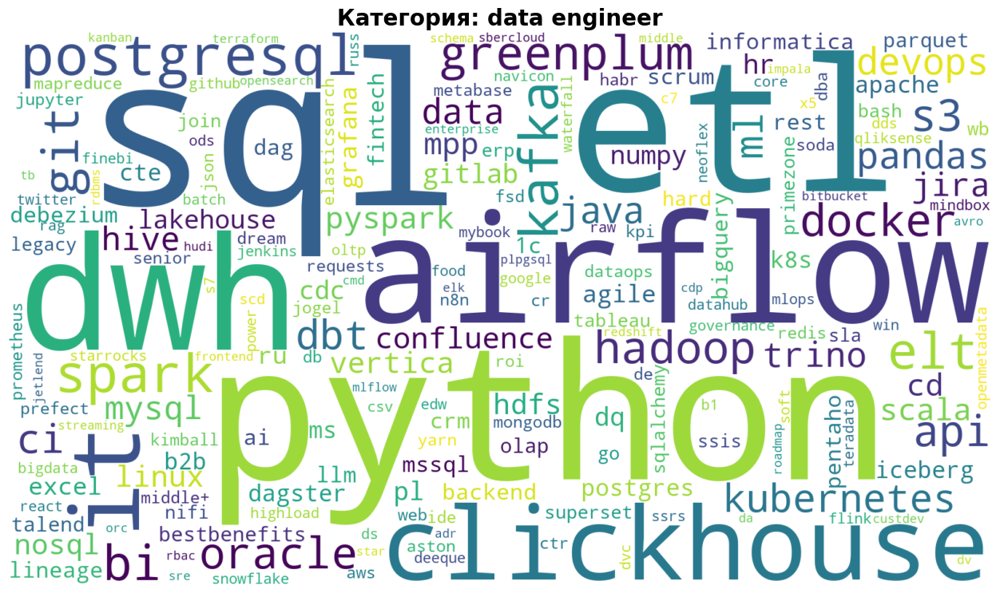

In [93]:
vacancy_category = list(df.vacancy_category.value_counts().index)

for category in vacancy_category:
    words_category = get_words_from_column_uniq_by_row(df.vacancy_description_tokenize[df.vacancy_category == category])
    df_freq_category = get_freq_df_by_words(words_category)
    df_freq_category = delete_rus_words_from_freq(df_freq_category)
    word_cloud_from_freq_df(df_freq_category, title="Категория: " +category)

Видим, что в целом получилось неплохо. Навыки соответствуют сфере в большинстве случаев. В категории Другое перемешалось все подряд

Картинка как гайд для человека какие технологии требуют работодатели при приеме на ту или иную роль. Заметно, что одну и ту же роль можно еще делить по направлениям. Например аналитик, бывают: бизнес аналитик, продуктовый аналитик, системный аналитик, bi-аналитик и тд, сейчас их скиллы немного смешиваются

Стоит учитывать, что мы считаем за навык только английские слова в силу специфики, поэтому мы можем какие-то упускать на русском. Например "ответственность", "управление рисками", "проектное управление" и другое. Но общее представление о профессии наша картинка точно дает потенцальному соискателю